In [1]:
options(warn = -1)
suppressMessages(require(Seurat))
suppressMessages(require(ggplot2))
suppressMessages(require(dplyr))
suppressMessages(require(reticulate))
suppressMessages(require(stringr))
suppressMessages(require(ggpubr))
suppressMessages(require(tidydr))
suppressMessages(require(CellTrek))
suppressMessages(require(CARD))
devtools::load_all('../Cell2Spatial/')

ℹ Loading Cell2Spatial


In [2]:
source('modules/globalParams.R')
source('modules/utils.R')
source('modules/vis.R')
source('modules/reformatProjResNew.R')

In [3]:
out.figs.dir <- '../2.results/cerebellum/figs'
out.data.dir <- '../2.results/cerebellum/data'

In [4]:
dir.create(out.figs.dir, showWarnings = FALSE, recursive = TRUE)
dir.create(out.data.dir, showWarnings = FALSE, recursive = TRUE)

In [5]:
MTH_COLOR <- c(
    'Reference'    = 'grey',
    'Cell2Spatial' = '#F7B263',
    'CytoSPACE' = '#D6AA8E',
    'CellTrek' = '#99C0CC',
    'Tangram' = 'lightgreen',
    'Seurat' = '#CC00FF'
)

### Loading kidney ST and SC datasets 

In [6]:
brain.st <- readRDS("../0.data/Cerebellum/cerebellum_ST.RDS")

In [7]:
brain.sc <- readRDS("../0.data/Cerebellum/cerebellum_SC.RDS")

In [14]:
brain.st <- brain.st %>% NormalizeData %>% FindVariableFeatures %>% ScaleData

Centering and scaling data matrix



In [58]:
colnames(brain.st@images$image@coordinates) <- c('row', 'col')

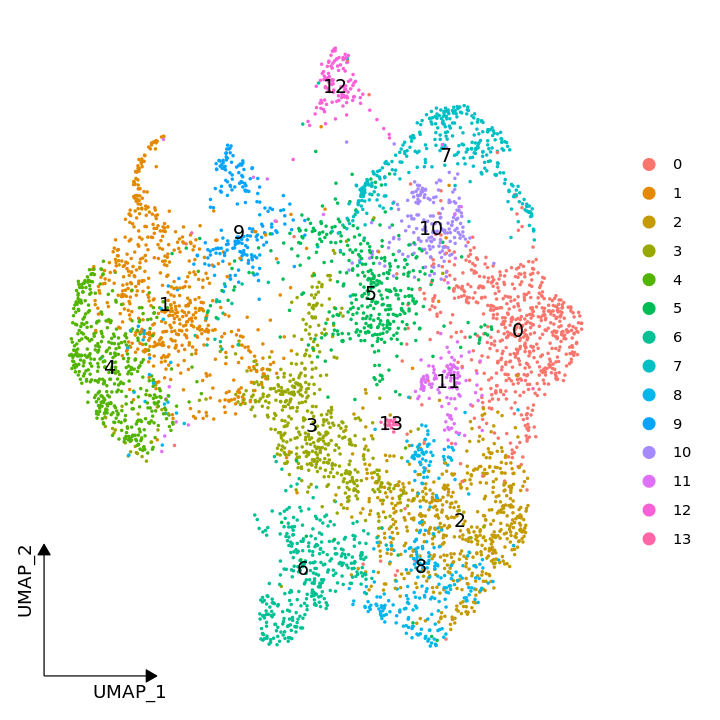

In [146]:
options(repr.plot.width = 6, repr.plot.height = 6)
DimPlot(brain.st, reduction = "umap", label = TRUE) + theme_dr(xlength = 0.2, ylength = 0.2, arrow = grid::arrow(length = unit(0.1, "inches"), ends = 'last', type = "closed")) + theme(panel.grid = element_blank())
ggsave(file.path(out.figs.dir, 'BRCA.ST.cluster.UMAP.dimplot.pdf'), width = 6, height = 6)

In [58]:
Idents(brain.sc) <- brain.sc$celltypeNew

In [154]:
options(future.globals.maxSize = 5000000 * 1024^2, future.seed = TRUE)

brain.sc <- SCTransform(brain.sc, ncells = 3000, verbose = FALSE) %>%
    RunPCA(verbose = FALSE) %>%
    RunUMAP(dims = 1 : 30, verbose = FALSE)

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’



In [ ]:
brain.sc$liger_ident_coarse

In [10]:
set.seed(20240502) 
cell.colors <- randomcoloR::distinctColorPalette(length(unique(brain.sc$liger_ident_coarse))) %>% `names<-`(unique(brain.sc$liger_ident_coarse))

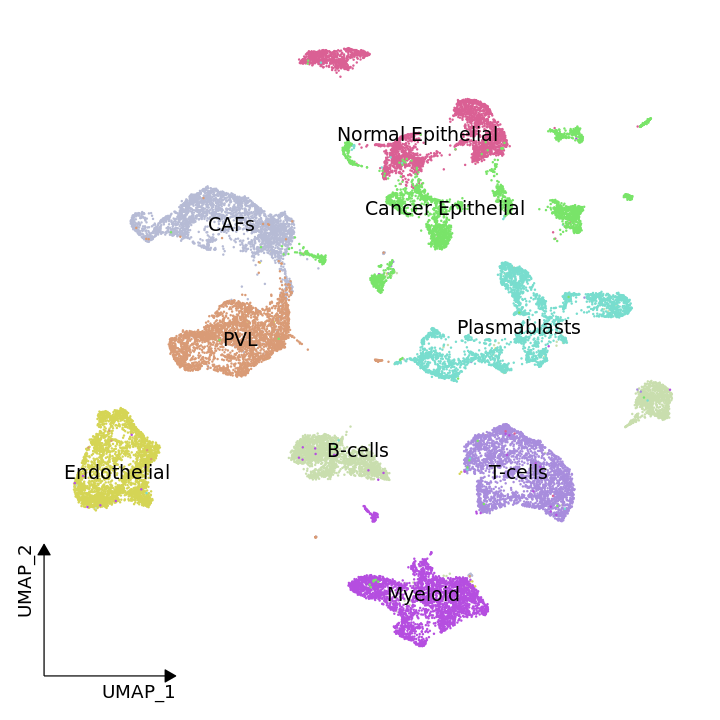

In [156]:
options(repr.plot.width = 6, repr.plot.height = 6)
DimPlot(brain.sc, label = TRUE, cols = cell.colors) + theme_dr(xlength = 0.2, ylength = 0.2, arrow = grid::arrow(length = unit(0.1, "inches"), ends = 'last', type = "closed")) + theme(panel.grid = element_blank()) + NoLegend()
ggsave(file.path(out.figs.dir, 'thymus.SC.cluster.UMAP.dimplot.pdf'), width = 6, height = 6)

In [157]:
levels(brain.sc) %>% length

[1] 9

In [315]:
dim(brain.sc)

[1] 23877 27000

In [316]:
dim(brain.st)

[1] 19451  4784

In [158]:
#markers <- FindAllMarkers(brain.st, only.pos = TRUE, logfc.threshold = 0.25, min.pct = 0.25, assay = 'SCT')

In [159]:
#openxlsx::write.xlsx(markers, file = file.path(out.data.dir, 'Thymus.ST.markers.xlsx'))

In [160]:
#top20.markers <- markers %>% group_by(cluster) %>% top_n(n = 50, wt = avg_log2FC)

In [78]:
sum(GetAssayData(brain.st, slot = 'counts') == 0)
sum(GetAssayData(brain.st, slot = 'counts') > 0)

[1] 264610870

[1] 3903226

In [80]:
min(colSums(GetAssayData(brain.st, slot = 'counts')))

[1] 100

In [83]:
length(unique(brain.sc$liger_ident_coarse))

[1] 19

In [84]:
brain.st

An object of class Seurat 
23096 features across 11626 samples within 1 assay 
Active assay: Spatial (23096 features, 0 variable features)
 2 layers present: counts, data
 1 image present: image

In [161]:
#saveRDS(brain.sc, file = file.path(out.data.dir, 'brain.sc.RDS'))
#saveRDS(brain.st, file = file.path(out.data.dir, 'brain.st.RDS'))

### Showing the projection performance for Cell2Spatial

In [22]:
cell2spatial <- readRDS('../2.results/cerebellum/cerebellum.cell2spatial.RDS')

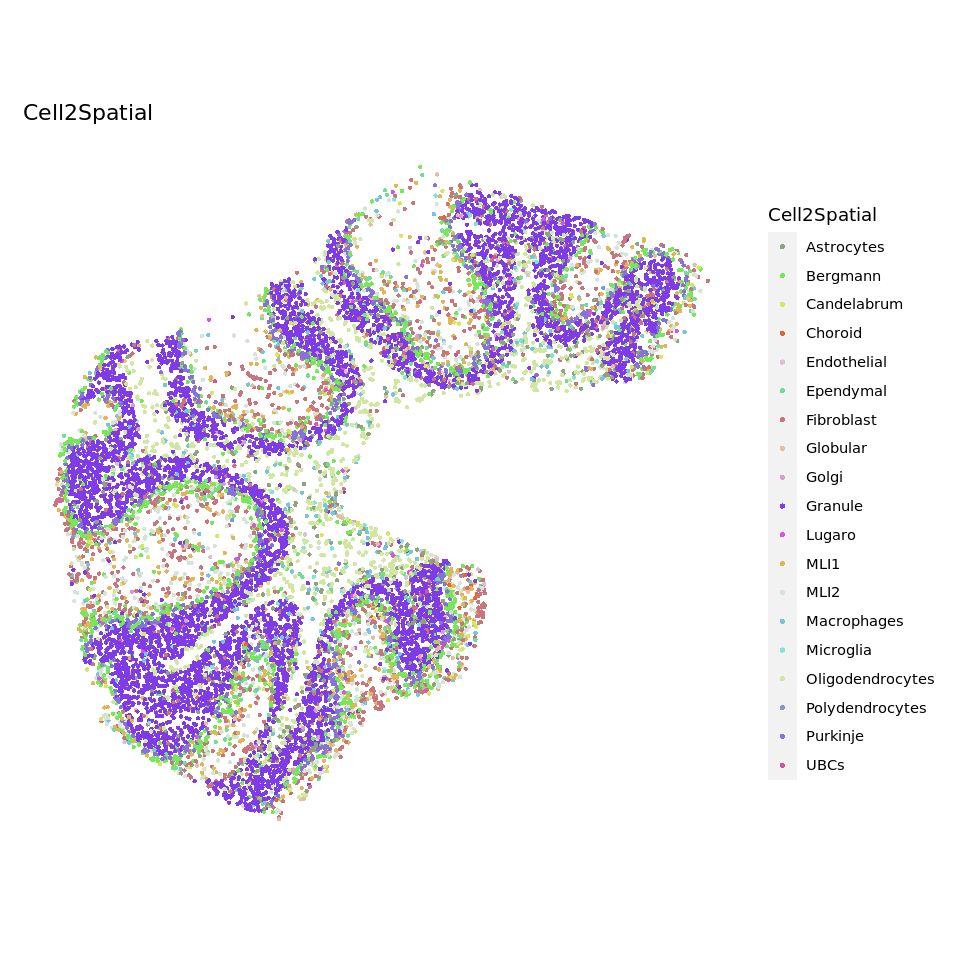

In [72]:
options(repr.plot.width = 8, repr.plot.height = 8)
SpatialPlot(cell2spatial, group.by = 'Cell2Spatial', pt.size = 1.6,  stroke = NA, cols = cell.colors) + ggtitle('Cell2Spatial')
ggsave(file.path(out.figs.dir, 'cell2spatial.entire.UMAP.pdf'), width = 8, height = 6)

In [31]:
length(cell2spatial$Cell2Spatial %>% unique)

[1] 19

In [32]:
f.ctypes <- cell2spatial$Cell2Spatial %>% unique
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(cell2spatial, Cell2Spatial == ct) %>% Cells
    #obj.sub <- seurat.res[, h.cells]
    SpatialPlot(cell2spatial, cells.highlight = h.cells, pt.size.factor = 1.8, stroke = NA, cols.highlight = c(as.vector(cell.colors[ct]), 'grey90')) + ggtitle(ct) + NoLegend() 
    #SpatialPlot(seurat.res, cells.highlight = h.cells, group.by = 'predicted.id', cols = cell.colors[ct], pt.size.factor = 1.8, stroke = NA, alpha = c(0.5, 1)) + ggtitle(ct) + NoLegend()  
})

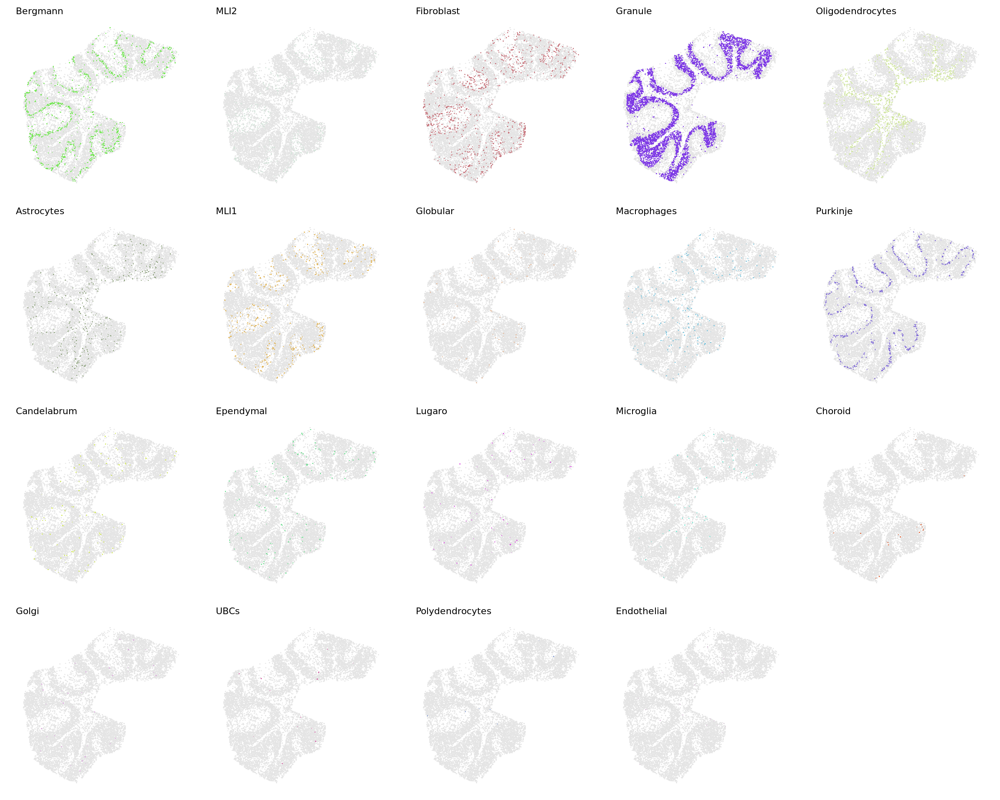

In [33]:
options(repr.plot.width = 20, repr.plot.height = 16)
ggarrange(plotlist = gps, nrow = 4, ncol = 5)
ggsave(file.path(out.figs.dir, 'cell2spatial.split.UMAP.pdf'), width = 20, height = 16)
ggsave(file.path(out.figs.dir, 'cell2spatial.split.UMAP.eps'), width = 20, height = 16)

### Showing the projection performance for CytoSpace

In [17]:
cytospace <- forCytoSpace('../2.results/cerebellum//cytospace/', brain.sc, brain.st)

In [18]:
cells <- cytospace@meta.data[!duplicated(cytospace@meta.data$SpotID), ] %>% rownames
cytospace <- cytospace[, cells]
head(cytospace@meta.data)

,UniqueCID,OriginalCID,CellType,SpotID,row,col
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>
UCID00000,UCID00000,I_F001_CGATGCGCATCAGCTA,Candelabrum,TAACCCCCCAGGTT,2114.983,4161.391
UCID00001,UCID00001,Vc_M002_CTCAGTCCAACCCTAA,Granule,TACTTTGTTCTACA,1812.890,3711.354
UCID00002,UCID00002,VI_F001_ACCTACCAGAAGTCCG,Candelabrum,CATTACACGAATCA,1982.605,4551.614
UCID00003,UCID00003,II_M006_ATCGCCTTCGGTCTGG,Fibroblast,CGCAGTGCCAGACC,4064.220,3579.756
UCID00004,UCID00004,Ib_M001_TATTTCGCAAAGACGC,Candelabrum,TCCAAGCAGCCCTG,1806.835,4516.165
UCID00005,UCID00005,IXb_M003_GCCAACGGTGAAGCTG,Globular,CAGGGCACGGAGCC,5350.278,2158.431


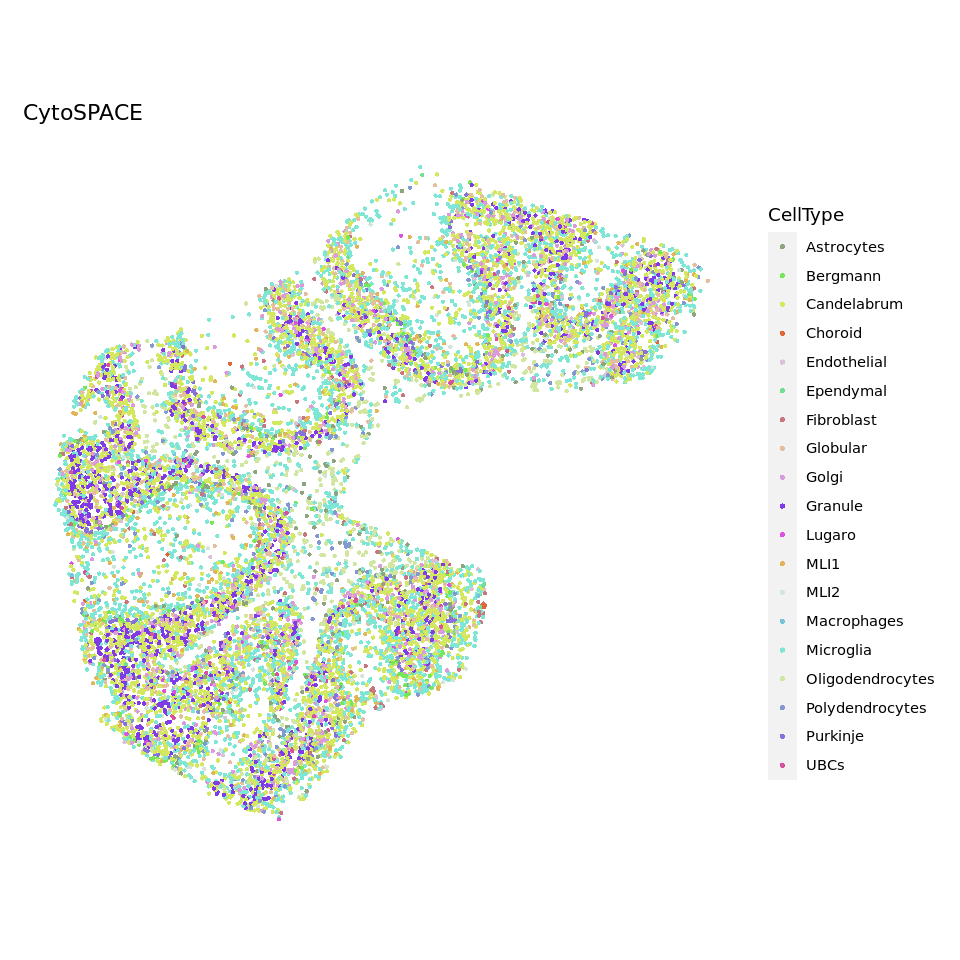

In [20]:
options(repr.plot.width = 8, repr.plot.height = 8)
SpatialPlot(cytospace, group.by = 'CellType', pt.size = 1.6, cols = cell.colors, stroke = NA) + ggtitle('CytoSPACE')
ggsave(file.path(out.figs.dir, 'cytospace.entire.UMAP.pdf'), width = 8, height = 6)

In [27]:
length(cytospace$CellType %>% unique)

[1] 19

In [28]:
f.ctypes <- cytospace$CellType  %>% unique
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(cytospace, CellType == ct) %>% Cells
    #obj.sub <- seurat.res[, h.cells]
    SpatialPlot(cytospace, cells.highlight = h.cells, pt.size.factor = 1.8, stroke = NA, cols.highlight = c(as.vector(cell.colors[ct]), 'grey90')) + ggtitle(ct) + NoLegend() 
    #SpatialPlot(seurat.res, cells.highlight = h.cells, group.by = 'predicted.id', cols = cell.colors[ct], pt.size.factor = 1.8, stroke = NA, alpha = c(0.5, 1)) + ggtitle(ct) + NoLegend()  
})

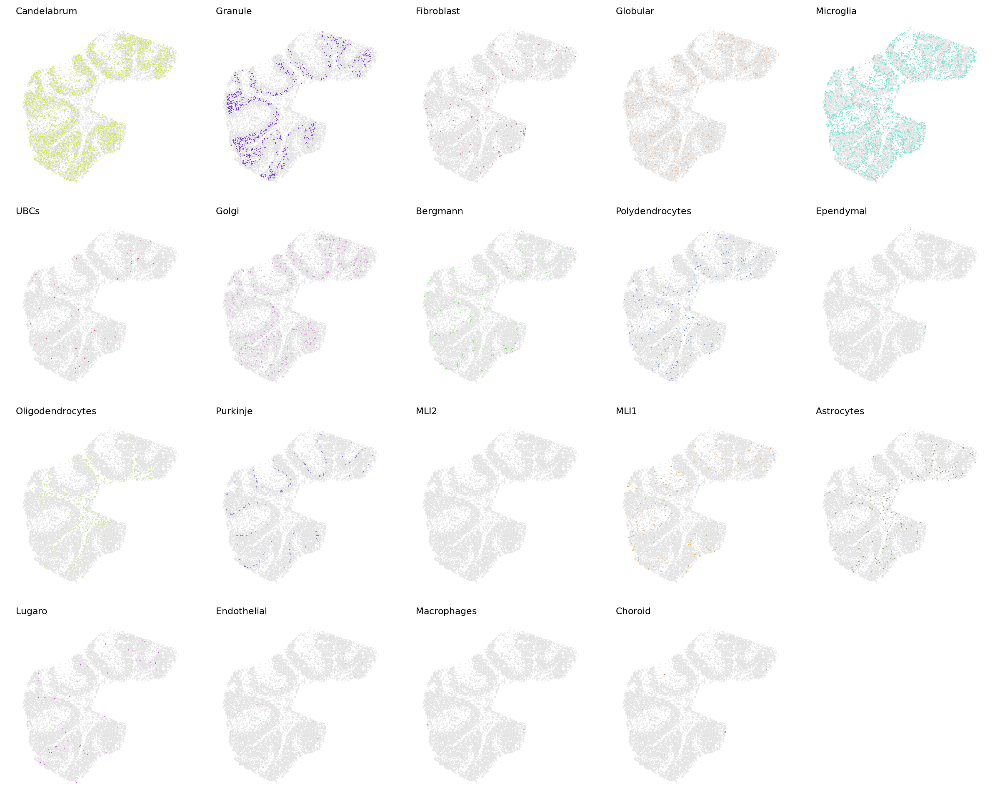

In [29]:
options(repr.plot.width = 20, repr.plot.height = 16)
ggarrange(plotlist = gps, nrow = 4, ncol = 5)
ggsave(file.path(out.figs.dir, 'cytospace.split.UMAP.pdf'), width = 20, height = 16)
ggsave(file.path(out.figs.dir, 'cytospace.split.UMAP.eps'), width = 20, height = 16)

### Showing the projection performance for tangram

In [40]:
colnames(brain.st@images$image@coordinates) <- c('row', 'col')

In [42]:
tangram <- forTangram('../2.results/cerebellum/cerebellum_tangram.xls', brain.sc, brain.st)

In [43]:
tangram@meta.data %>% head

,X,orig.ident,nCount_RNA,nFeature_RNA,nGene,nUMI,regions,liger_ident,liger_ident_coarse,SpotID,row,col,NA,x.new,y.new
,<chr>,<int>,<dbl>,<int>,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
PRMb_M002_TGGTAGTAGATTGACA,PRMb_M002_TGGTAGTAGATTGACA,1,4290,2067,2107,4366,PRM,Gfap_Apoe_Astrocytes,Astrocytes,ATACGACCCGCAAC,4215.088,3139.807,ATACGACCCGCAAC,4216.033,3140.351
SIMc_M006_AACCAACCAGTTGCGC,SIMc_M006_AACCAACCAGTTGCGC,1,5587,2558,2602,5667,SIM,Gpc5_Astrocytes,Astrocytes,CTTGCCACAGAGAG,2909.459,1125.450,CTTGCCACAGAGAG,2905.058,1123.149
PFc_F002_TACCTCGCAGGATCTT,PFc_F002_TACCTCGCAGGATCTT,0,4637,2021,2059,4700,PF,Tnr_Astrocytes,Astrocytes,CTATCATCATTTAA,2877.071,2490.250,CTATCATCATTTAA,2881.206,2492.304
IIb_F001_TCCTTCTTCACCTTAT,IIb_F001_TCCTTCTTCACCTTAT,0,5559,2197,2230,5612,II,Nrxn1_Gpc5_Astrocytes,Astrocytes,CCTCGCCTTCTCTT,2158.109,2835.017,CCTCGCCTTCTCTT,2151.440,2830.697
VIIa_M002_GACTCTCCAAGGTCAG,VIIa_M002_GACTCTCCAAGGTCAG,1,4652,2415,2460,4714,VII,Gfap_Apoe_Astrocytes,Astrocytes,GATGTAATCCCAGC,3239.159,1868.619,GATGTAATCCCAGC,3233.743,1871.197
Xa_F001_AGCTTCCAGGTCGAGT,Xa_F001_AGCTTCCAGGTCGAGT,0,1784,1044,1062,1805,X,Nrxn1_Gpc5_Astrocytes,Astrocytes,TTAAATCTTTGTTC,3884.660,2322.495,TTAAATCTTTGTTC,3876.674,2320.297


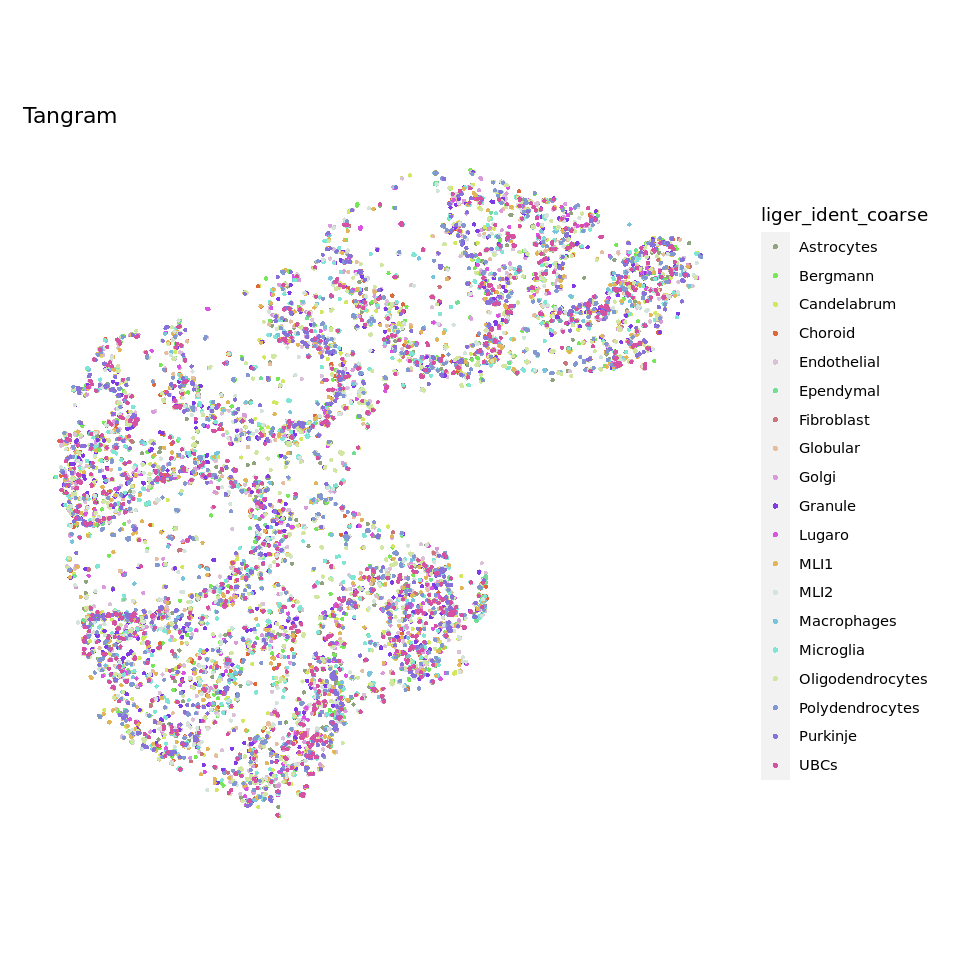

In [45]:
options(repr.plot.width = 8, repr.plot.height = 8)
SpatialPlot(tangram, group.by = 'liger_ident_coarse', pt.size = 1.6,  cols = cell.colors, stroke = NA) + ggtitle('Tangram')
ggsave(file.path(out.figs.dir, 'tangram.entire.UMAP.pdf'), width = 8, height = 6)

In [46]:
length(f.ctypes <- tangram$liger_ident_coarse %>% unique)

[1] 19

In [47]:
f.ctypes <- tangram$liger_ident_coarse %>% unique
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(tangram, liger_ident_coarse == ct) %>% Cells
    #obj.sub <- seurat.res[, h.cells]
    SpatialPlot(tangram, cells.highlight = h.cells, pt.size.factor = 1.8, stroke = NA, cols.highlight = c(as.vector(cell.colors[ct]), 'grey90')) + ggtitle(ct) + NoLegend() 
    #SpatialPlot(seurat.res, cells.highlight = h.cells, group.by = 'predicted.id', cols = cell.colors[ct], pt.size.factor = 1.8, stroke = NA, alpha = c(0.5, 1)) + ggtitle(ct) + NoLegend()  
})

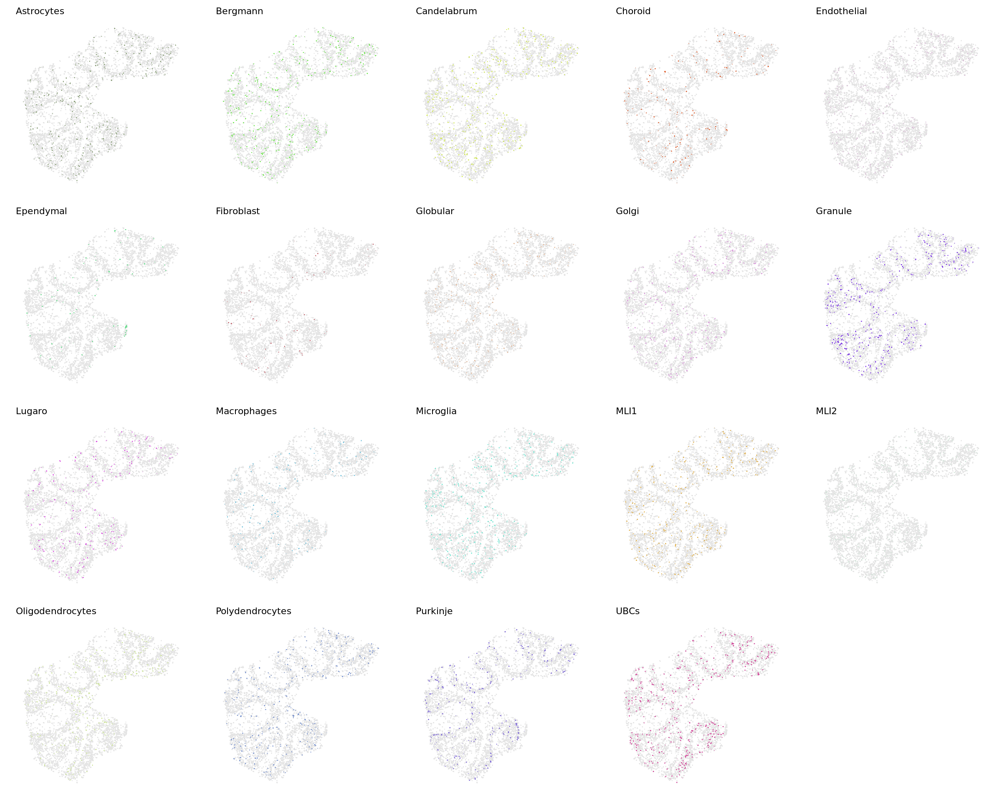

In [48]:
options(repr.plot.width = 20, repr.plot.height = 16)
ggarrange(plotlist = gps, nrow = 4, ncol = 5)
ggsave(file.path(out.figs.dir, 'tangram.split.UMAP.pdf'), width = 20, height = 16)
ggsave(file.path(out.figs.dir, 'tangram.split.UMAP.eps'), width = 20, height = 16)

### Showing the projection performance for Seurat

In [34]:
seurat.res <- readRDS('../2.results/cerebellum/slide.seq.RDS') 

In [35]:
seurat.res@meta.data %>% head

,orig.ident,nCount_Spatial,nFeature_Spatial,spot_class,first_type,second_type,first_class,second_class,min_score,singlet_score,conv_all,conv_doublet
,<fct>,<dbl>,<int>,<fct>,<fct>,<fct>,<lgl>,<lgl>,<dbl>,<dbl>,<lgl>,<lgl>
GCCTTGCTGAGCTC,SeuratProject,702,539,singlet,Bergmann,Granule,FALSE,FALSE,782.7982,802.1731,TRUE,TRUE
AGATACCAAGCCTT,SeuratProject,441,364,reject,Astrocytes,Lugaro,FALSE,FALSE,525.7123,565.7123,TRUE,TRUE
CCGATTAAAGCGGT,SeuratProject,511,388,doublet_uncertain,MLI2,Bergmann,FALSE,FALSE,555.6171,608.1152,TRUE,TRUE
GACTGTGGGGGCGA,SeuratProject,264,210,singlet,Fibroblast,Microglia,FALSE,FALSE,352.1039,367.4947,TRUE,TRUE
GTGGGCGAGCTTCC,SeuratProject,133,121,singlet,MLI2,Endothelial,FALSE,FALSE,195.8990,197.7164,TRUE,TRUE
GGTTCGCGACCACA,SeuratProject,421,341,doublet_certain,Granule,Ependymal,FALSE,FALSE,450.7560,474.2322,TRUE,TRUE


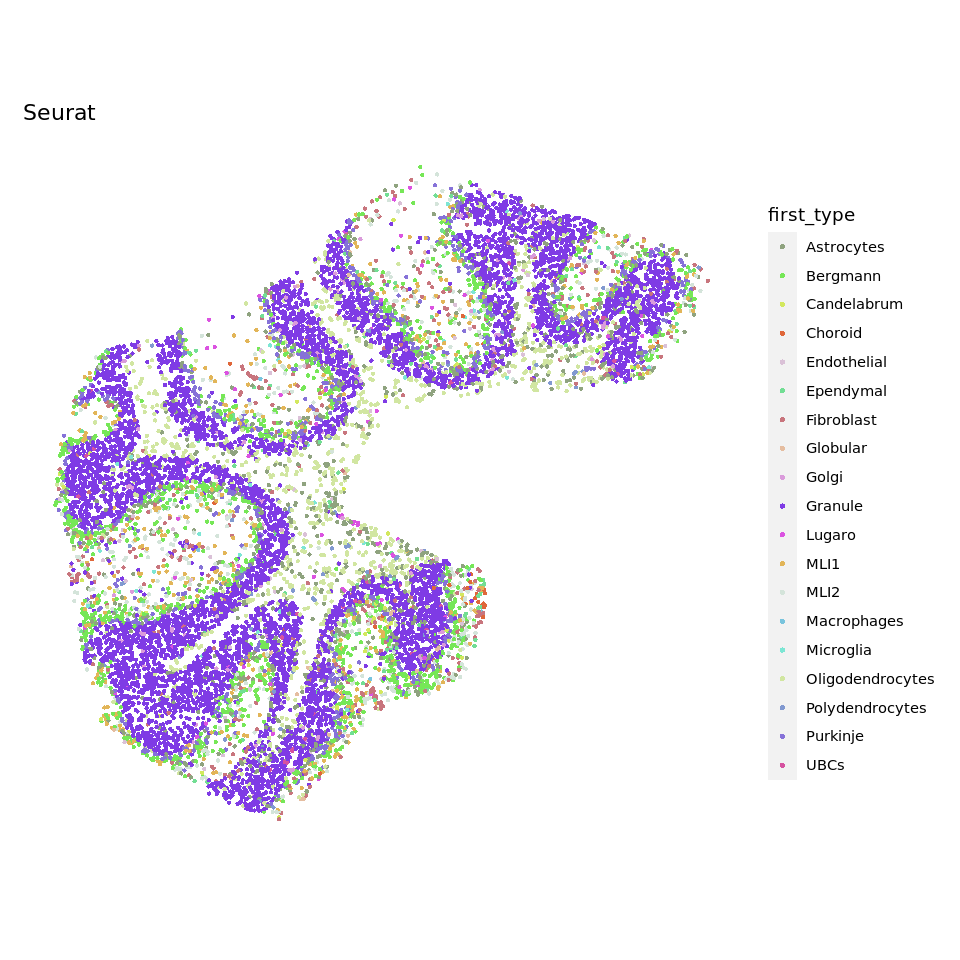

In [36]:
options(repr.plot.width = 8, repr.plot.height = 8)
SpatialPlot(seurat.res, group.by = 'first_type', pt.size = 1.6, cols = cell.colors, stroke = NA) + ggtitle('Seurat')
ggsave(file.path(out.figs.dir, 'seurat.entire.UMAP.pdf'), width = 8, height = 6)

In [37]:
length(f.ctypes <- seurat.res$first_type %>% unique)

[1] 19

In [14]:
f.ctypes

[1] "Bergmann"         "Candelabrum"      "Microglia"        "Astrocytes"      
 [5] "Oligodendrocytes" "Granule"          "MLI1"             "Fibroblast"      
 [9] "Purkinje"         "MLI2"             "Polydendrocytes"  "Golgi"           
[13] "UBCs"             "Choroid"          "Endothelial"      "Ependymal"

In [38]:
f.ctypes <- seurat.res$first_type %>% unique
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(seurat.res, first_type == ct) %>% Cells
    #obj.sub <- seurat.res[, h.cells]
    SpatialPlot(seurat.res, cells.highlight = h.cells, pt.size.factor = 1.8, stroke = NA, cols.highlight = c(as.vector(cell.colors[ct]), 'grey90')) + ggtitle(ct) + NoLegend() 
    #SpatialPlot(seurat.res, cells.highlight = h.cells, group.by = 'predicted.id', cols = cell.colors[ct], pt.size.factor = 1.8, stroke = NA, alpha = c(0.5, 1)) + ggtitle(ct) + NoLegend()  
})

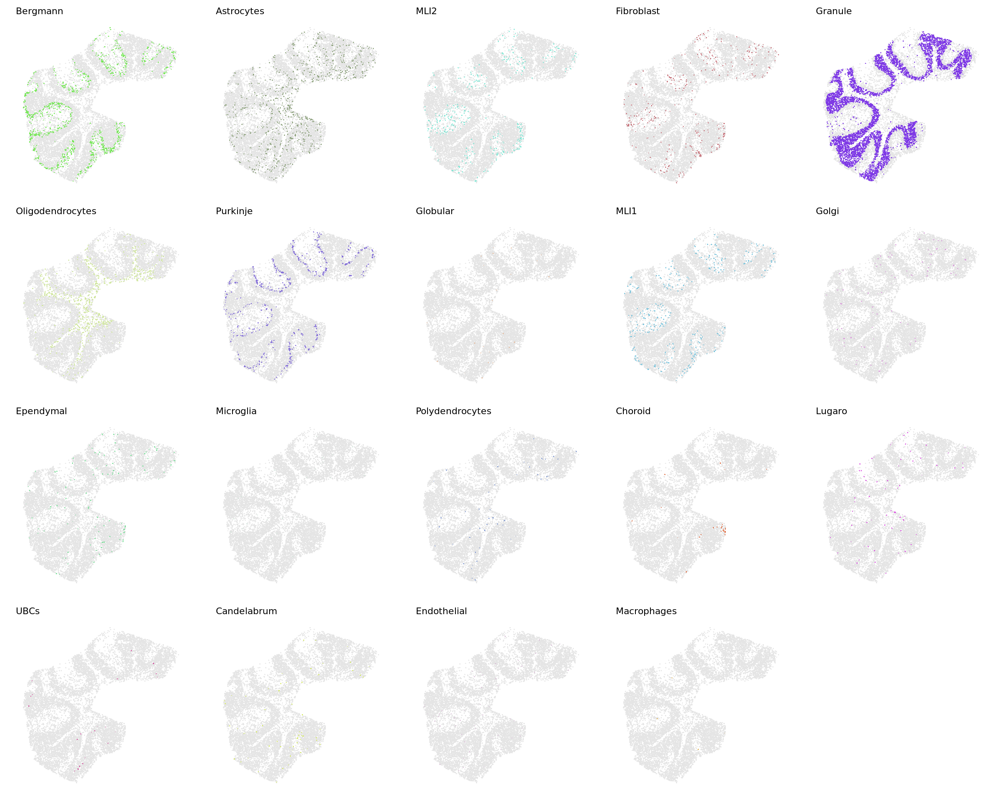

In [39]:
options(repr.plot.width = 20, repr.plot.height = 16)
ggarrange(plotlist = gps, nrow = 4, ncol = 5)
ggsave(file.path(out.figs.dir, 'seurat.split.UMAP.pdf'), width = 20, height = 16)
ggsave(file.path(out.figs.dir, 'seurat.split.UMAP.eps'), width = 20, height = 16)

#### Compare the marker gene expression

In [393]:
options(future.globals.maxSize = 50000000 * 1024^2, future.seed = TRUE)

In [455]:
seurat.res$predicted.id <- seurat.res$first_type

In [396]:
Idents(seurat.res) <- seurat.res$predicted.id
de.markers <- FindAllMarkers(seurat.res, only.pos = TRUE, logfc.threshold = 0.25, min.pct = 0.25)

Calculating cluster Entorhinal cortex

Calculating cluster CA Principal cells

Calculating cluster Oligodendrocyte

Calculating cluster Astrocyte

Calculating cluster Ependymal

Calculating cluster Interneuron

Calculating cluster Dentate Principal cells

Calculating cluster Subiculum

Calculating cluster Dentate hilum

Calculating cluster Endothelial tip

Calculating cluster Polydendrocyte

Calculating cluster Neurogenesis (SGZ)

Calculating cluster Microglia

Calculating cluster Endothelial stalk

Calculating cluster Mural

Calculating cluster Resident macrophage



In [397]:
top5.markers <- de.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_log2FC)
top5.markers <- split(top5.markers$gene, top5.markers$cluster)

In [457]:
cytospace <- AddModuleScore(cytospace %>% NormalizeData, features = top5.markers)
cell2spatial <- AddModuleScore(cell2spatial %>% NormalizeData, features = top5.markers)
tangram <- AddModuleScore(tangram %>% NormalizeData, features = top5.markers)
seurat.res <- AddModuleScore(seurat.res %>% NormalizeData, features = top5.markers)

In [458]:
tar.ctypes <- c("Dentate Principal cells", "CA3 Principal cells", "Entorhinal cortex", "Endothelial tip", "Ependymal", "Oligodendrocyte")
tar.ctypes <- intersect(tar.ctypes, levels(seurat.res))
idxes <- which(names(top5.markers) %in% tar.ctypes)
tar.ctypes

[1] "Dentate Principal cells" "Entorhinal cortex"      
[3] "Endothelial tip"         "Ependymal"              
[5] "Oligodendrocyte"

In [459]:
obj.tmp <- subset(seurat.res %>% NormalizeData %>% ScaleData, idents = tar.ctypes)
levels(obj.tmp) <- tar.ctypes

Centering and scaling data matrix



In [460]:
gp <- DoHeatmap(obj.tmp, group.by = 'predicted.id', features = top5.markers[tar.ctypes] %>% unlist %>% unique, group.colors = cell.colors[tar.ctypes]) + scale_fill_gradientn(colors = c("gray", "white", "red"))
ggsave(file.path(out.figs.dir, 'marker.expr.pdf'), width = 5, height = 8)

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


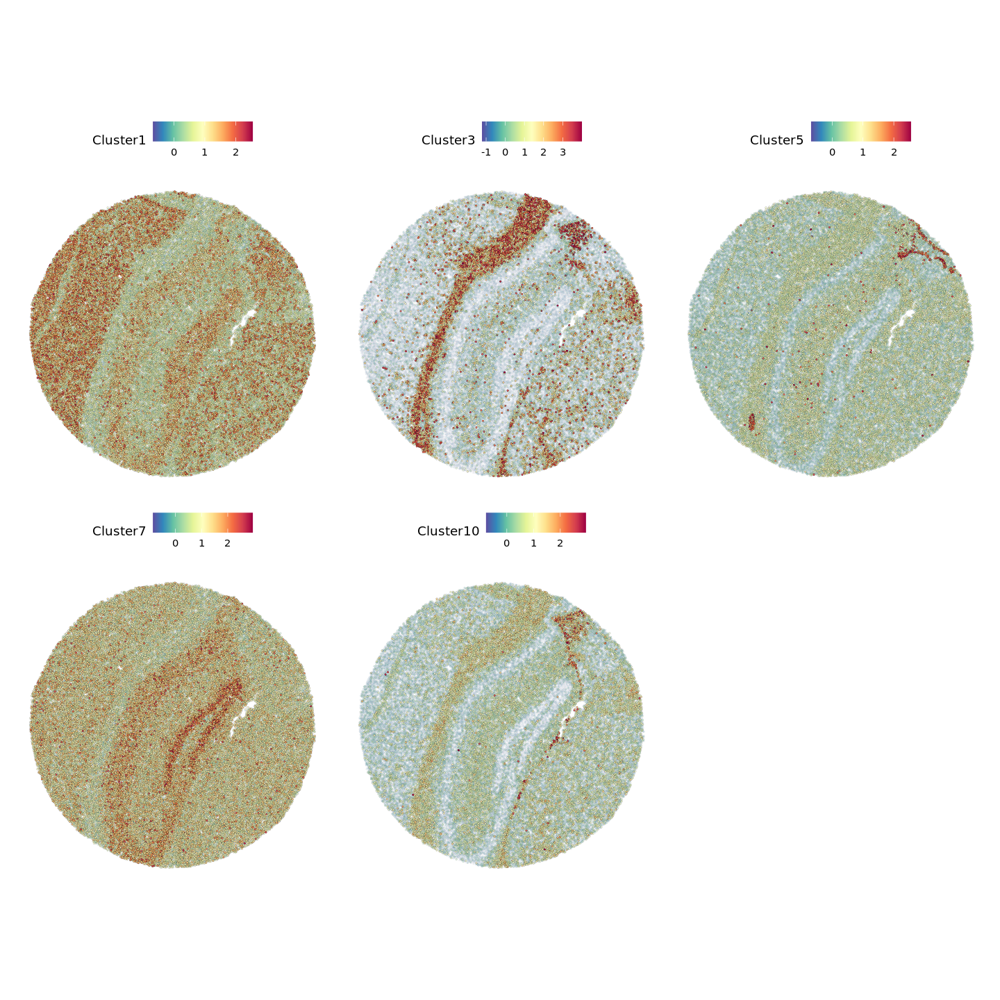

In [461]:
options(repr.plot.width = 12, repr.plot.height = 12)
SpatialFeaturePlot(cell2spatial %>% NormalizeData, features = paste0('Cluster', idxes), alpha = c(0, 1))
ggsave(file.path(out.figs.dir, 'cell2spatial.markers.pdf'), width = 12, height = 12)

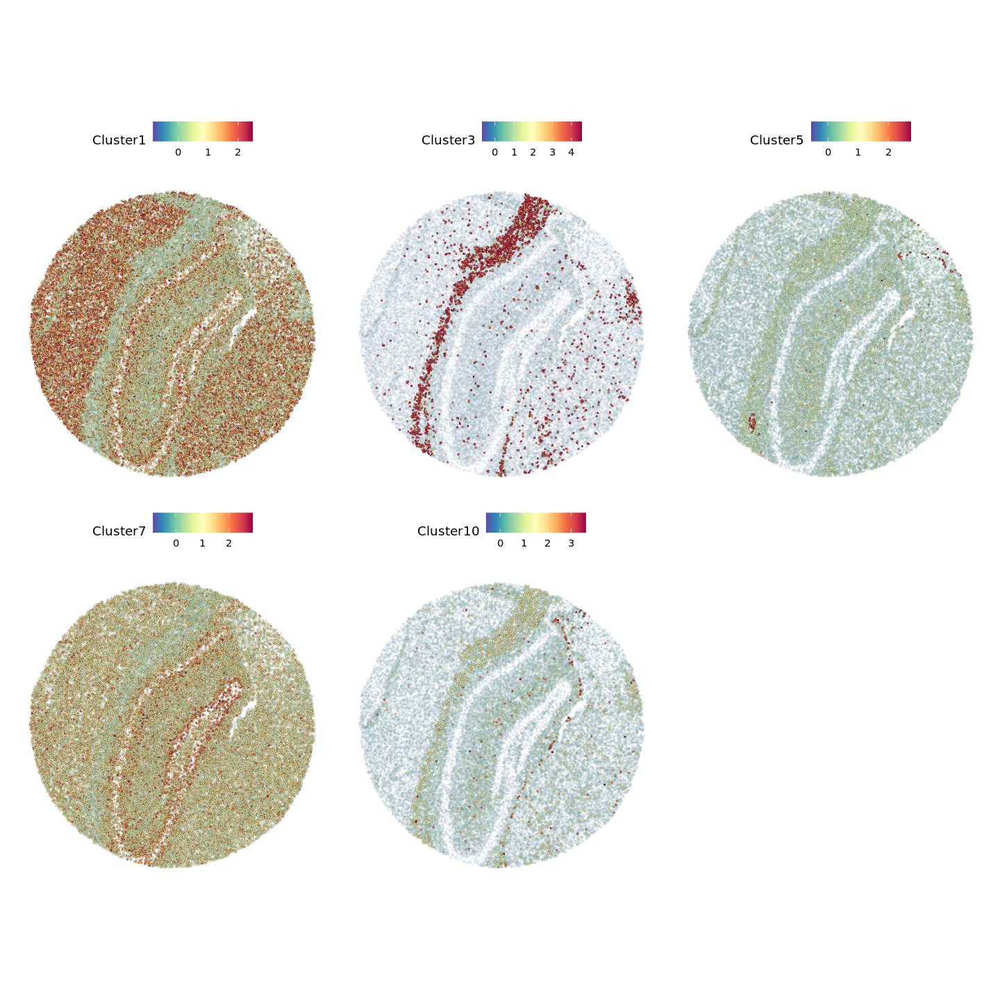

In [462]:
options(repr.plot.width = 12, repr.plot.height = 12)
SpatialFeaturePlot(cytospace %>% NormalizeData, features = paste0('Cluster', idxes), alpha = c(0, 1))
ggsave(file.path(out.figs.dir, 'cytospace.markers.pdf'), width = 12, height = 12)

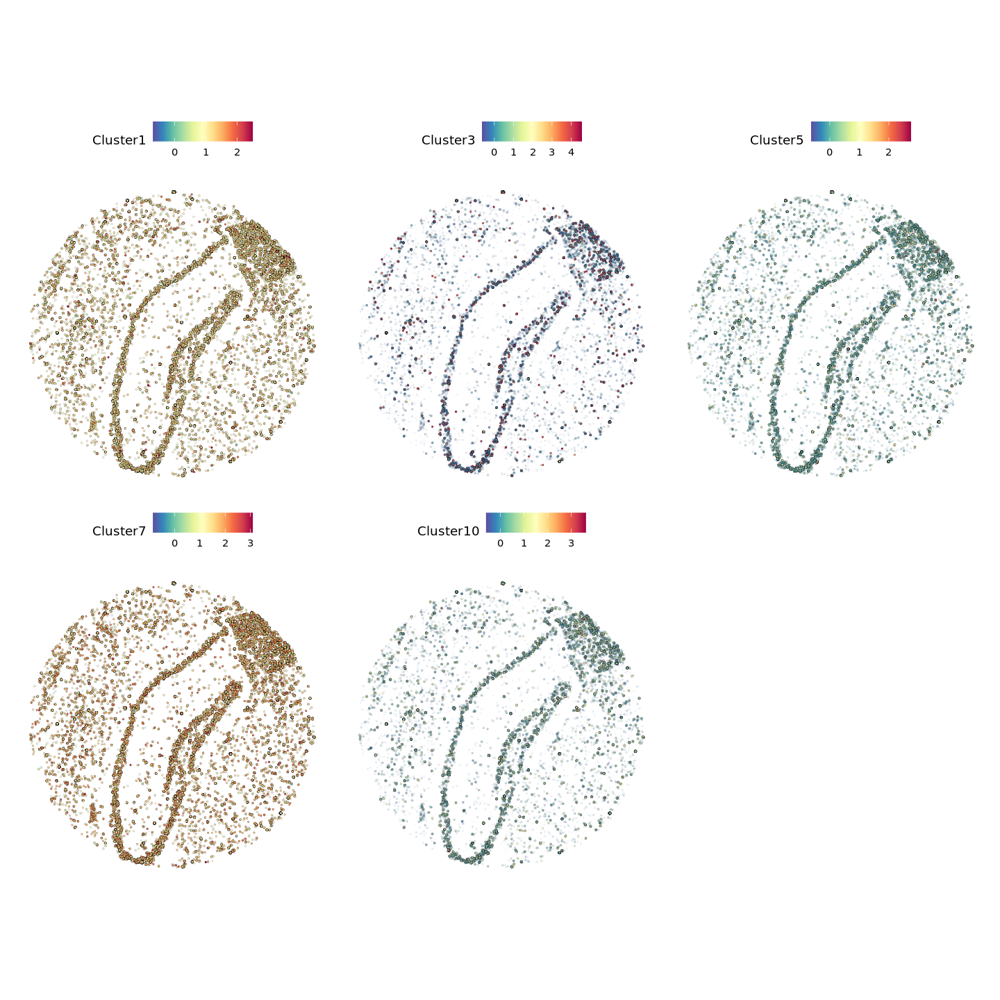

In [463]:
options(repr.plot.width = 12, repr.plot.height = 12)
SpatialFeaturePlot(tangram %>% NormalizeData, features = paste0('Cluster', idxes), alpha = c(0, 1))
ggsave(file.path(out.figs.dir, 'tangram.markers.pdf'), width = 12, height = 12)

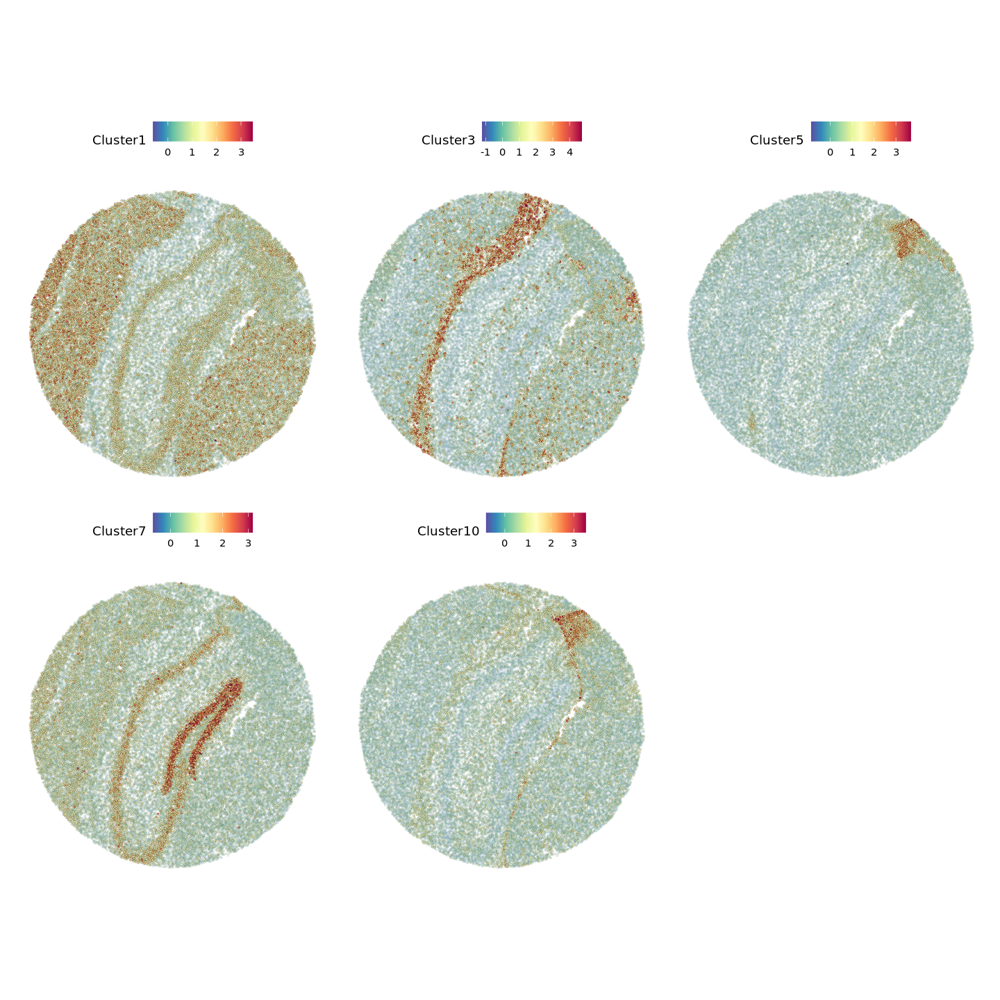

In [464]:
options(repr.plot.width = 12, repr.plot.height = 12)
SpatialFeaturePlot(seurat.res, features = paste0('Cluster', idxes), alpha = c(0, 1)) #& scale_fill_gradientn(colors = c("gray90", "white", "red"))
ggsave(file.path(out.figs.dir, 'seurat.markers.pdf'), width = 12, height = 12)

In [533]:
library(ggpointdensity)
library(viridis)

In [538]:
cytospace <- AddModuleScore(cytospace %>% NormalizeData, features = top5.markers)
cell2spatial <- AddModuleScore(cell2spatial %>% NormalizeData, features = top5.markers)
tangram <- AddModuleScore(tangram %>% NormalizeData, features = top5.markers)
seurat.res <- AddModuleScore(seurat.res %>% NormalizeData, features = top5.markers)

In [539]:
scatterPlot <- function(seurat.res, cytospace, idx, spot.col = 'SpotID') {
    idx <- paste0('Cluster', idx)
    meta.1 <- seurat.res@meta.data
    meta.2 <- cytospace@meta.data
    meta.2 <- meta.2[!duplicated(meta.2[, spot.col]), ]
    rownames(meta.2) <- meta.2[, spot.col]
    ovp.sopts <- intersect(rownames(meta.1), rownames(meta.2))
    var1 <- meta.1[ovp.sopts, idx]
    var2 <- meta.2[ovp.sopts, idx]  
    plot.df <- cbind.data.frame(True = var1, Tool = var2)
    gp <- ggplot(plot.df, aes(x = True, y = Tool)) +  geom_pointdensity() + geom_smooth(method = lm, color = 'red') + scale_color_viridis() + stat_cor()    
}

In [540]:
gps <- lapply(idxes, function(idx) {
    scatterPlot(seurat.res, cytospace, idx)   
})

In [6]:
options(repr.plot.width = 20, repr.plot.height = 5)
gp <- ggarrange(plotlist = gps, ncol = 5)#
gsave(file.path(out.figs.dir, 'cytospace.markers.exp.pdf'), width = 20, height = 5)

In [7]:
gps <- lapply(idxes, function(idx) {
    scatterPlot(seurat.res, cell2spatial, idx, spot.col = 'SpotName')   
})

options(repr.plot.width = 20, repr.plot.height = 5)
gp = ggarrange(plotlist = gps, ncol = 5)
ggsave(file.path(out.figs.dir, 'cell2spatial.markers.exp.pdf'), width = 20, height = 5)

In [8]:
gps <- lapply(idxes, function(idx) {
    scatterPlot(seurat.res, tangram, idx, spot.col = 'SpotID')   
})

options(repr.plot.width = 20, repr.plot.height = 5)
gp <- ggarrange(plotlist = gps, ncol = 5)
ggsave(file.path(out.figs.dir, 'tangram.markers.exp.pdf'), width = 20, height = 5)

#### Accuracy analysis

In [49]:
seurat.res$predicted.id <- seurat.res$first_type

In [50]:
true.res <- seurat.res$predicted.id
cell2sp.pres <- cell2spatial@meta.data

In [51]:
meta.cyto <- cytospace@meta.data
meta.cyto <- meta.cyto[!duplicated(meta.cyto$SpotID), ]
cyto.pres <- meta.cyto$CellType %>% `names<-`(meta.cyto$SpotID)

In [5]:
cell2sp.pres <- cell2spatial@meta.data$Cell2Spatial %>% `names<-`(cell2spatial$SpotName)
cell2sp.pres <- lapply(unique(seurat.res$predicted.id), function(idx) {
    spots.1 <- true.res[true.res == idx] %>% names
    spots.2 <- cell2sp.pres[cell2sp.pres == idx] %>% names
    length(intersect(spots.1, spots.2)) / length(unique(spots.1))
}) %>% unlist %>% `names<-`(unique(seurat.res$predicted.id))
cell2sp.pres

In [54]:
meta.cyto <- cytospace@meta.data
meta.cyto <- meta.cyto[!duplicated(meta.cyto$SpotID), ]
cyto.pres <- meta.cyto$CellType %>% `names<-`(meta.cyto$SpotID)

In [4]:
cyto.res <- lapply(unique(seurat.res$predicted.id), function(idx) {
    spots.1 <- true.res[true.res == idx] %>% names
    spots.2 <- cyto.pres[cyto.pres == idx] %>% names
    length(intersect(spots.1, spots.2)) / length(unique(spots.1))
}) %>% unlist %>% `names<-`(unique(seurat.res$predicted.id))

In [57]:
meta.tang <- tangram@meta.data
meta.tang <- meta.tang[!duplicated(meta.tang$SpotID), ]
tang.pres <- meta.tang$liger_ident_coarse %>% `names<-`(meta.tang$SpotID)

In [3]:
tang.pres <- lapply(unique(seurat.res$predicted.id), function(idx) {
    spots.1 <- true.res[true.res == idx] %>% names
    spots.2 <- tang.pres[tang.pres == idx] %>% names
    length(intersect(spots.1, spots.2)) / length(unique(spots.1))
}) %>% unlist %>% `names<-`(unique(seurat.res$predicted.id))

In [59]:
plot.df <- cbind.data.frame(Cell2Spatial = cell2sp.pres, CytoSPACE = cyto.res, Tangram = tang.pres, CellType = names(cell2sp.pres))
plot.df <- tidyr::gather(plot.df, 'Methods', 'Accuracy', -CellType)

In [2]:
options(repr.plot.width = 12, repr.plot.height = 5)
gp <- ggplot(plot.df, aes(x = CellType, y = Accuracy, fill = Methods)) + geom_bar(stat = 'identity', position=position_dodge()) + theme_bw() + theme(axis.text.x = element_text(angle = 45, hjust = 1), plot.title = element_text(hjust = 0.5)) + scale_fill_manual(values = MTH_COLOR[c('Cell2Spatial', 'CytoSPACE', 'Tangram')]) + xlab('') + ggtitle('Slide-seq v2 of cerebellum data')
ggsave(file.path(out.figs.dir, 'accruact.pdf'), width = 12, height = 5)